In [1]:
import os
import glob
import nibabel as nb
import scipy.stats
from brainspace.mesh.mesh_io import read_surface
from brainspace.plotting import plot_hemispheres
from brainspace.gradient import GradientMaps
from brainspace.mesh.array_operations import smooth_array
import numpy as np
import seaborn as sns
import pandas as pd

In [2]:
# Path to MICAPIPEsurf = mask_5k !
micapipe=os.popen("echo $MICAPIPE").read()[:-1]

# Load native mid surface
inf_lh = read_surface(micapipe + '/surfaces/fsLR-5k.L.inflated.surf.gii', itype='gii')
inf_rh = read_surface(micapipe + '/surfaces/fsLR-5k.R.inflated.surf.gii', itype='gii')

# Load native mid surface
inf_lh32 = read_surface(micapipe + '/surfaces/fsLR-32k.L.inflated.surf.gii', itype='gii')
inf_rh32 = read_surface(micapipe + '/surfaces/fsLR-32k.R.inflated.surf.gii', itype='gii')

# Load native pial surface
#pial_lh = read_surface(dir_FS+'/surf/lh.pial', itype='fs')
#pial_rh = read_surface(dir_FS+'/surf/rh.pial', itype='fs')

mask_lh =  nb.load(micapipe + '/surfaces/fsLR-5k.R.mask.shape.gii').darrays[0].data
mask_rh =  nb.load(micapipe + '/surfaces/fsLR-5k.L.mask.shape.gii').darrays[0].data
mask_5k = np.concatenate((mask_lh, mask_rh), axis=0)

# Boolean mask
mask_surf = mask_5k != 0

## Create a brain mask derived from the thickness

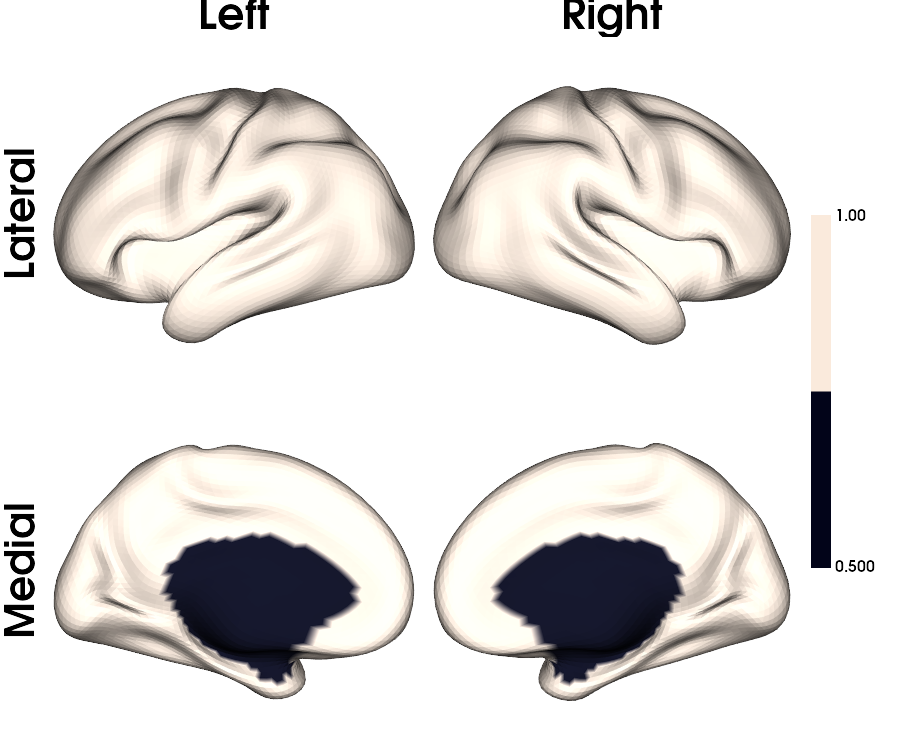

In [3]:
# Set dataset PNI as working directory
os.chdir('/data_/mica3/BIDS_PNI/derivatives/micapipe_v0.2.0')

# Load thickness to make a better mask
lh_files = sorted(glob.glob('sub-PNC*/ses-01/maps/*_hemi-L_surf-fsLR-5k_label-thickness.func.gii'))
rh_files = sorted(glob.glob('sub-PNC*/ses-01/maps/*_hemi-R_surf-fsLR-5k_label-thickness.func.gii'))

# Load all the thickness data
Nth=np.concatenate((nb.load(lh_files[0]).darrays[0].data, nb.load(rh_files[0]).darrays[0].data), axis=0).shape[0]

surf_map=np.empty([len(lh_files), Nth], dtype=float)
for i, _ in enumerate(lh_files):
    surf_map[i,:] = np.hstack(np.concatenate((nb.load(lh_files[i]).darrays[0].data, nb.load(rh_files[i]).darrays[0].data), axis=0))
    # Mean matrix across the x axis (vertices)
    map_mean = np.mean(surf_map, axis=0)

#mask_5k = np.where(map_mean<0.3,False, True)
plot_hemispheres(inf_lh, inf_rh, array_name=mask_5k, cmap='rocket', nan_color=(0, 0, 0, 1),
                              zoom=1.3, size=(900, 750), embed_nb=True,
                              color_bar='right', layout_style='grid', color_range=(0.5,1),
                              label_text={'left': ['Lateral', 'Medial'], 'top': ['Left', 'Right']},
                              screenshot=False)

## Build MPC

In [5]:
# load stuff
from brainspace.datasets import load_mask
mask_32k = load_mask(join=True)

inf32_lh = read_surface(micapipe + '/surfaces/fsLR-5k.L.inflated.surf.gii', itype='gii')
inf32_rh = read_surface(micapipe + '/surfaces/fsLR-5k.R.inflated.surf.gii', itype='gii')

In [6]:
# Smooth intencities
def smooth_surf(surf_l, surf_r, points, Mask, Kernel='uniform', Niter=3, Relax=0.35):
    '''
    This function smooth an array (left and right) on a given surface
    Parameters
    ----------
    surf_l : np.array left surface 
    surf_r : np.array right surface
    points : np.array surface data
    Kernel : {'uniform', 'gaussian', 'inverse_distance'}
    Niter  : int, optional Number of smooth iterations
    Relax  : relax : float, optional relaxation factor
    Mask   : str or 1D ndarray, optional
    Returns
    -------
    sdata : smoothed numpy array
    
    '''
    Ndim = Mask.shape[0] 
    n2dim = int(Ndim/2)
    Mask_l=Mask[0:n2dim]
    Mask_r=Mask[n2dim:Ndim]
    sdata = np.concatenate((smooth_array(surf_l, points[0:n2dim],kernel=Kernel, n_iter=Niter,relax=Relax, mask=Mask_l), 
                          smooth_array(surf_r, points[n2dim:Ndim],kernel=Kernel, n_iter=Niter,relax=Relax, mask=Mask_r)), axis=0)
    return(sdata)

# Smooth each intencity
def smooth_intensities(int_profile):
    smoothed_i = np.copy(int_profile)
   
    # smooth each intensity
    for i in range(int_profile.shape[0]):
        smoothed_i[i,:] = smooth_surf(inf_lh, inf_rh, int_profile[i,:], mask_surf,Niter=5, Relax=0.5, Kernel='uniform')
   
    return(smoothed_i)

In [7]:
# Function to build the MPC from an intencity profile
def build_mpc(data, mask):
    # If no parcellation is provided, MPC will be computed vertexwise
    I = data

    # Calculate mean across columns, excluding mask and any excluded labels input
    I_M = np.nanmean(np.float32(np.where(mask, I, np.nan)), axis=1)

    # Get residuals of all columns (controlling for mean)
    I_resid = np.zeros(I.shape)
    for c in range(I.shape[1]):
        y = I[:,c]
        x = I_M
        slope, intercept, _, _, _ = scipy.stats.linregress(x,y)
        y_pred = intercept + slope*x
        I_resid[:,c] = y - y_pred

    # Calculate correlation coefficient of the intesities with residuals
    R = np.corrcoef(I_resid, rowvar=False)

    # Log transform
    MPC = 0.5 * np.log( np.divide(1 + R, 1 - R) )
    MPC[np.isnan(MPC)] = 0
    MPC[np.isinf(MPC)] = 0

    # CLEANUP: correct diagonal and round values to reduce file size
    # Replace all values in diagonal by zeros to account for floating point error
    for i in range(0,MPC.shape[0]):
            MPC[i,i] = 0
    
    # Output MPC, microstructural profiles, and problem nodes
    return (MPC)

# Create the gradients from the MPC matrix
def mpc_dm(MPC, mpc_mask, Ngrad=3, Smooth=False, kernel=None):
    # Cleanup before diffusion embeding
    MPC[~np.isfinite(MPC)] = 0
    MPC[np.isnan(MPC)] = 0
    MPC[MPC==0] = np.finfo(float).eps

    # Get the index of the non medial wall regions
    indx = np.where(mpc_mask==1)[0]

    # Slice the matrix
    MPC_masked = MPC[indx, :]
    MPC_masked = MPC_masked[:, indx]
    MPC_masked.shape

    # Calculate the gradients
    MPCgm = GradientMaps(n_components=Ngrad, random_state=None, approach='dm', kernel=kernel)
    MPCgm.fit(MPC_masked, sparsity=0.9)
    
    # Map gradients to surface
    grad = [None] * Ngrad
    for i, g in enumerate(MPCgm.gradients_.T[0:Ngrad,:]):
        # create a new array filled with NaN values
        g_nan = np.full(mask_surf.shape, np.nan)
        g_nan[indx] = g

        # fill in the calculated values into the corresponding indices of the new array
        if Smooth==True:
            grad[i] = smooth_surf(inf_lh, inf_rh, g_nan, mask_surf,Niter=3, Relax=0.35, Kernel='uniform')
        else:
            grad[i] = g_nan
    
    return(MPCgm, grad)

def map_to_labels5k(mpc_sliced, mask):
    # Get the index of the non medial wall regions
    mask_indx = np.where(mask==1)[0]
    # map to the labels
    labels_5k = np.full(mask.shape, np.nan)
    labels_5k[mask_indx] = mpc_sliced
    return(labels_5k)

    
# Load files
def make_mpc5k(files):
    # Load all the matrices
    Ndim=9684
    M=np.empty([Ndim, Ndim, len(files)], dtype=float)
    for i, f in enumerate(files):
        print(f)
        int_profile = nb.load(f).darrays[0].data
        M[:,:,i] = build_mpc(smooth_intensities(int_profile), mask_surf)
        #M[:,:,i] = build_mpc(int_profile, mask_surf)

    return M

In [8]:
# Set the working directory to the 'out' directory
out='/data_/mica3/BIDS_PNI/derivatives'  # <<<<<<<<<<<< CHANGE THIS PATH
os.chdir(f'{out}/micapipe_v0.2.0')

Ngrad=3
Nplot = 3
# Labels for plotting based on Nplot
labels=['G'+str(x) for x in list(range(1,Nplot+1))]

## Cortical MPC (T1map)

In [9]:
# -----------------------------------------------------------------------------
# All subjects
acq='T1map'
# MPC files
cfile_names = ["03", "06", "07", "09", "10", "15", "16", "18", "19", "22"]

cfile_paths = [f"sub-PNC0{name}/ses-03/mpc/acq-T1map/*_surf-fsLR-5k_desc-intensity_profiles.shape.gii" for name in cfile_names]

cfiles_all = []
for cfile_path in cfile_paths:
    cfiles_all.extend(glob.glob(cfile_path))
    
# Load intensity profiles from each file
    profiles = []
    for cfile_path in cfiles_all:
        cprofile_data = nb.load(cfile_path).darrays[0].data
        profile_smooth = smooth_intensities(cprofile_data)
        profile_smooth[:, mask_5k == False] = np.nan
        profiles.append(profile_smooth)
    
    profiles = np.array(profiles)
    mean_cprofiles = np.mean(profiles, axis=0)

# make the MPC
cmpc_all = build_mpc(mean_cprofiles, mask_surf)

/tmp/ipykernel_3697704/3896308213.py:22: RuntimeWarning: divide by zero encountered in divide
  MPC = 0.5 * np.log( np.divide(1 + R, 1 - R) )


In [10]:
# Calculate the gradients
Ngrad=5
cMPC_all, cgrad = mpc_dm(cmpc_all, mask_5k, Ngrad=Ngrad, Smooth=False, kernel="cosine")

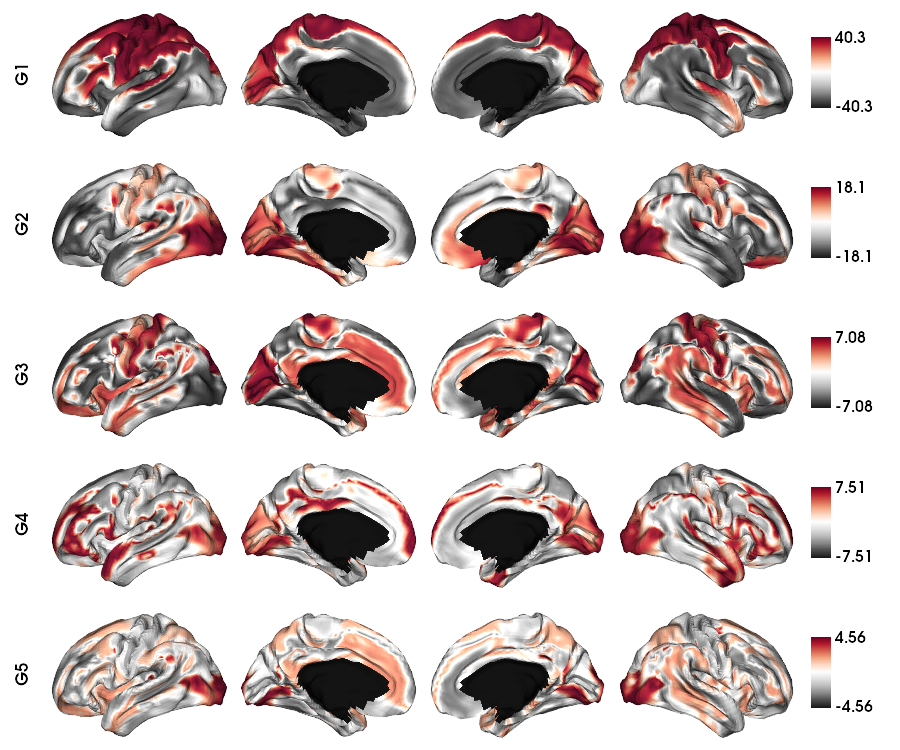

In [11]:
import cmocean
# Load fsLR 5k
f5k_lh = read_surface(micapipe + '/surfaces/fsLR-5k.L.surf.gii', itype='gii')
f5k_rh = read_surface(micapipe + '/surfaces/fsLR-5k.R.surf.gii', itype='gii')

# plot the gradients
labels=['G'+str(x) for x in list(range(1,Ngrad+1))]
plot_hemispheres(f5k_lh, f5k_rh, array_name=cgrad, cmap='RdGy_r', nan_color=(0, 0, 0, 1),
  zoom=1.5, size=(900, 750), embed_nb=True, color_range = 'sym',
  color_bar='right', label_text={'left': labels}, screenshot=False)

In [13]:
np.save('/host/percy/local_raid/youngeun/myjupyter/array/T1map_GM_G1.npy', cgrad[0])

/data/mica1/03_projects/youngeun/venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/gradient/embedding.py:70: UserWarning: Affinity is not symmetric. Making symmetric.
  warnings.warn('Affinity is not symmetric. Making symmetric.')
/data/mica1/03_projects/youngeun/venv/lib/python3.8/site-packages/brainspace-0.1.10-py3.8.egg/brainspace/gradient/embedding.py:77: UserWarning: Graph is not fully connected.
  warnings.warn('Graph is not fully connected.')


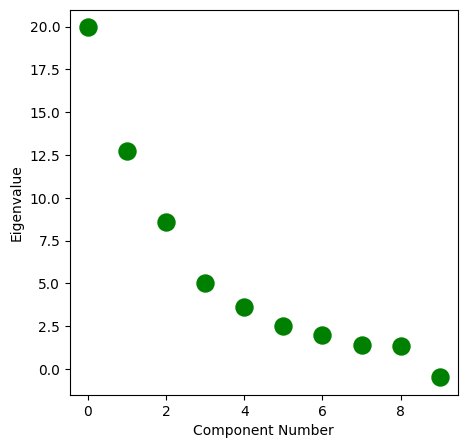

In [92]:
from brainspace.gradient import GradientMaps

# Ask for 10 gradients (default)
gm = GradientMaps(n_components=10, random_state=0)
gm.fit(cmpc_all)

import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, figsize=(5, 5))
ax.scatter(range(gm.lambdas_.size), gm.lambdas_, s=150, c='green')
ax.set_xlabel('Component Number')
ax.set_ylabel('Eigenvalue')

plt.show()

In [95]:
np.save('/host/percy/local_raid/youngeun/myjupyter/array/qT1_GM_G1.npy', cgrad[0])

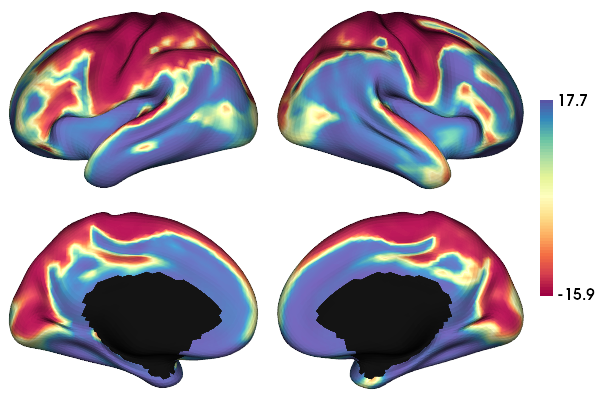

In [169]:
plot_hemispheres(inf_lh, inf_rh, array_name=cgrad[0], cmap='Spectral', nan_color=(0, 0, 0, 1),
  zoom=1.6, size=(600, 400), embed_nb=True, layout_style='grid',
  color_bar='right', screenshot=False)

### Line plots for cortical T1map

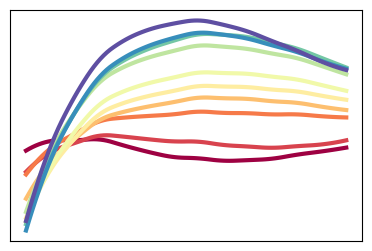

In [171]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import minmax_scale
from scipy.interpolate import interp1d

# extract G1
cG1 = np.array(cgrad[0]) # cortical G1

# 10 bins
gBins = np.arange(0, 110, 10)

# Remove mask and find bin limits
tmpGrpG = minmax_scale(cG1, feature_range=(0,1))
tmpGrpG[~mask_5k] = np.nan
g_split = np.nan_to_num(tmpGrpG)
Ts = np.percentile(g_split, gBins)

# Average profile in each bin, while subtracting the mean profile excluding mask
profiles_demean = np.zeros((mean_cprofiles.shape[0], len(gBins)-1))

for ii in range(len(Ts)-1):
    idx = np.where((g_split > Ts[ii]) & (g_split < Ts[ii+1]))[0]
    profiles_demean[:, ii] = np.mean(mean_cprofiles[:, idx] - np.mean(mean_cprofiles[:, mask_5k], axis=1)[:, np.newaxis], axis=1)

# Smooth interpolation
smoothed_profiles = []
x_values = np.arange(len(profiles_demean[:, 0]))

for profile in profiles_demean.T:
    f = interp1d(x_values, profile, kind='quadratic')
    x_interp = np.linspace(0, len(profile) - 1, 100)
    y_interp = f(x_interp)
    smoothed_profiles.append(y_interp)

# Plot
colors_profiles = plt.cm.Spectral(np.linspace(0, 1, 10))

plt.figure(figsize=(10,3))
plt.subplot(121)

for smoothed_profile, color in zip(smoothed_profiles, colors_profiles):
    plt.plot(x_interp, smoothed_profile, color=color, linewidth=3)

plt.yticks([])
plt.xticks([])
plt.show()


## SWM MPC (T1map)

In [165]:
import seaborn as sns
import matplotlib.pyplot as plt
def plot_connectome(mtx, Title='matrix plot', xlab='X', ylab='Y', col='rocket', vmin=None, vmax=None,
                   xticklabels='auto', yticklabels='auto',xrot=90, yrot=0):
    
    '''
    This optional function, only plots a connectome as a heatmap
    Parameters
    ----------
    mtx : np.array
    Returns
    -------
    f : plot
    '''
    f, ax = plt.subplots(figsize=(15,10))
    g = sns.heatmap(mtx, ax=ax, cmap=col, vmin=vmin, vmax=vmax, xticklabels=xticklabels, yticklabels=yticklabels)
    g.set_xlabel(xlab)
    g.set_ylabel(ylab)
    g.set_title(Title)
    # Rotate the x-axis labels
    # rotate tick labels
    ax.set_xticklabels(ax.get_xticklabels(), rotation=xrot, ha='right')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=yrot, ha='right')

In [168]:
# -----------------------------------------------------------------------------
# All subjects
acq='T1map'
# MPC files
sfile_names = ["03", "06", "07", "09", "10", "15", "16", "18", "19", "22"]

sfile_paths = [f"sub-PNC0{name}/ses-03/mpc-swm/acq-T1map_orig/*_surf-fsLR-5k_desc-intensity_profiles.shape.gii" for name in sfile_names]

sfiles_all = []
for sfile_path in sfile_paths:
    sfiles_all.extend(glob.glob(sfile_path))

# Load intensity profiles from each file
    sprofiles = []
    for sfile_path in sfiles_all:
        sprofile_data = nb.load(sfile_path).darrays[0].data
        sprofiles.append(sprofile_data)
    
    sprofiles = np.array(sprofiles)
    mean_sprofiles = np.mean(sprofiles, axis=0)

# make the MPC
smpc_all = make_mpc5k(sfiles_all)

# Mean matrix across the z axis (subjects)
smpc_all_avg = np.mean(smpc_all, axis=2)

sub-PNC003/ses-03/mpc-swm/acq-T1map_orig/sub-PNC003_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii


/tmp/ipykernel_133965/3896308213.py:22: RuntimeWarning: divide by zero encountered in divide
  MPC = 0.5 * np.log( np.divide(1 + R, 1 - R) )
/tmp/ipykernel_133965/3896308213.py:22: RuntimeWarning: divide by zero encountered in log
  MPC = 0.5 * np.log( np.divide(1 + R, 1 - R) )


sub-PNC006/ses-03/mpc-swm/acq-T1map_orig/sub-PNC006_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC007/ses-03/mpc-swm/acq-T1map_orig/sub-PNC007_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC009/ses-03/mpc-swm/acq-T1map_orig/sub-PNC009_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC010/ses-03/mpc-swm/acq-T1map_orig/sub-PNC010_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC015/ses-03/mpc-swm/acq-T1map_orig/sub-PNC015_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC016/ses-03/mpc-swm/acq-T1map_orig/sub-PNC016_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC018/ses-03/mpc-swm/acq-T1map_orig/sub-PNC018_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC019/ses-03/mpc-swm/acq-T1map_orig/sub-PNC019_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii
sub-PNC022/ses-03/mpc-swm/acq-T1map_orig/sub-PNC022_ses-03_surf-fsLR-5k_desc-intensity_profiles.shape.gii


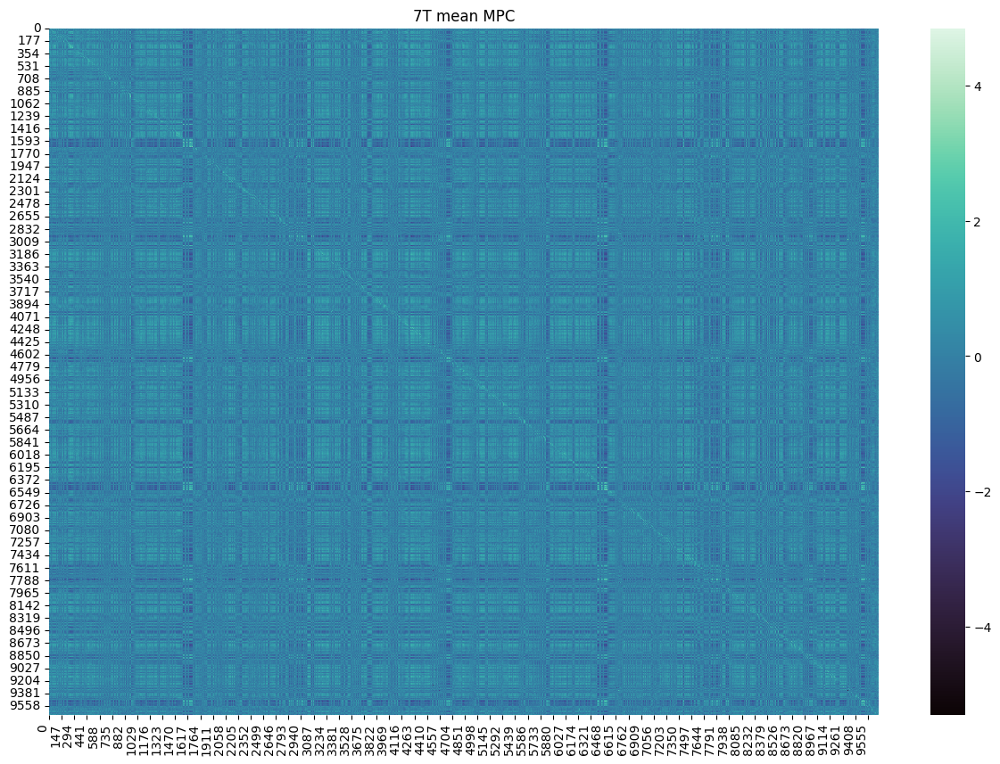

In [169]:
# plot the matrix connectome
plot_connectome(smpc_all_avg, Title='7T mean MPC', xlab='', ylab='', col='mako', vmin=None, vmax=None,
                   xticklabels='auto', yticklabels='auto',xrot=90, yrot=0)

In [170]:
# Calculate the sum of each column
column_sums = np.sum(smpc_all_avg, axis=0)

# Sort the indices of columns based on their sums
sorted_indices = np.argsort(column_sums)

# Rearrange columns based on sorted indices
sorted_smpc_all_avg = smpc_all_avg[:, sorted_indices]
sorted_smpc_all_avg = sorted_smpc_all_avg[sorted_indices, :]


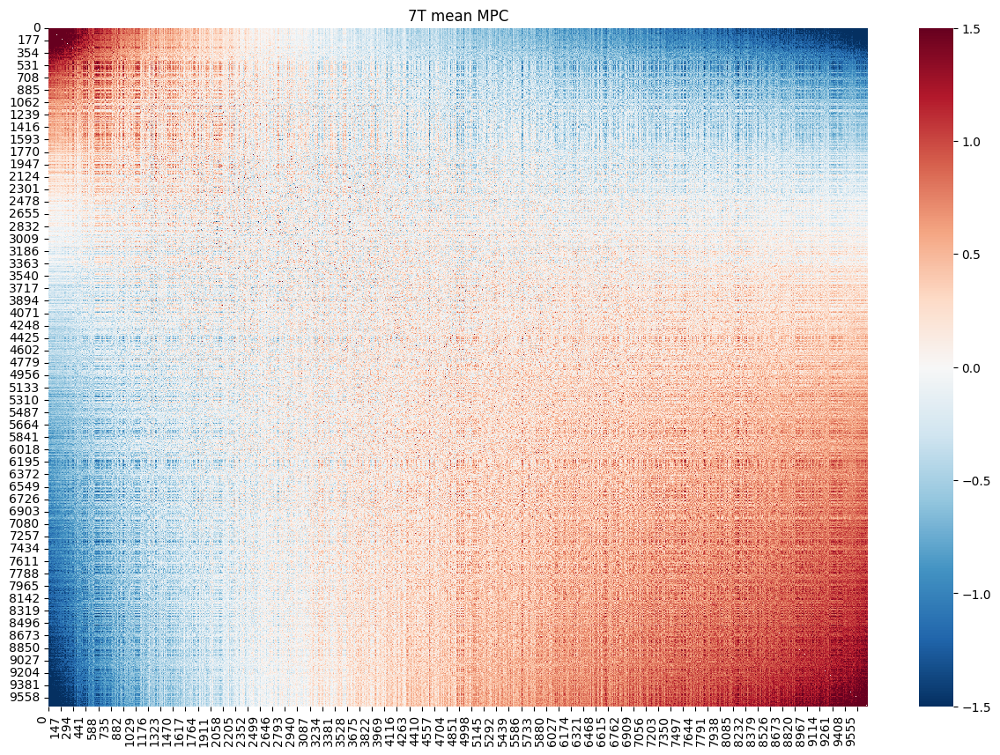

In [171]:
import cmocean
cmaps = cmocean.cm.cmap_d

# plot the matrix connectome
plot_connectome(sorted_smpc_all_avg, Title='7T mean MPC', xlab='', ylab='', col='RdBu_r', vmin=-1.5, vmax=1.5,
                   xticklabels='auto', yticklabels='auto',xrot=90, yrot=0)

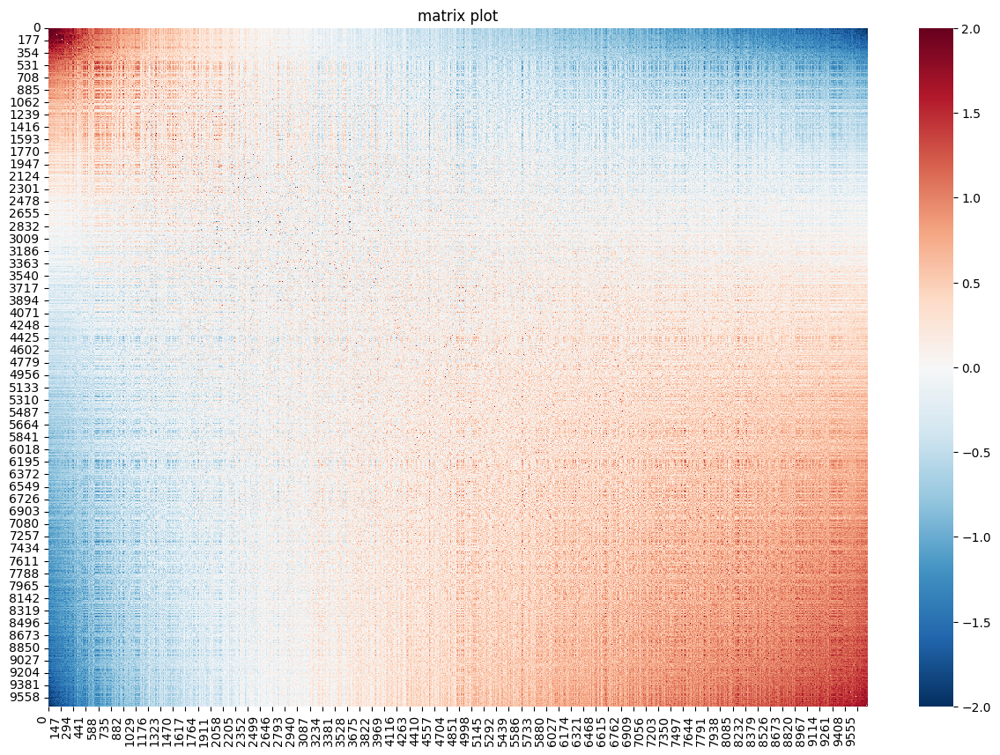

In [177]:
# plot the matrix connectome
plot_connectome(sorted_smpc_all_avg, xlab='', ylab='', col='RdBu_r', vmin=-2, vmax=2,
                   xrot=90, yrot=0)

### B1 corrected T1map

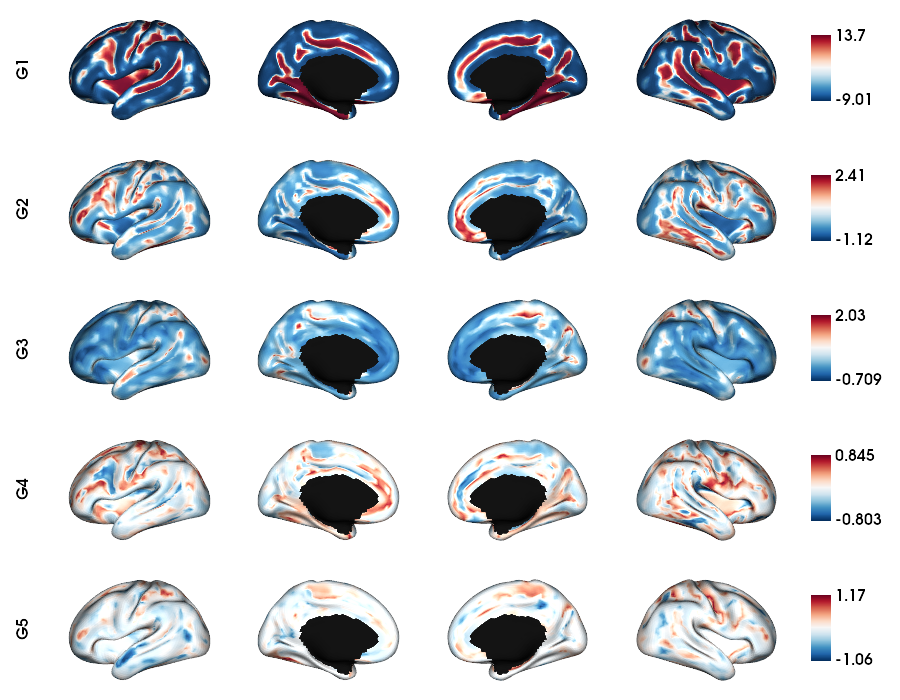

In [10]:
# Calculate the gradients
Ngrad=5
sMPC_all, sgrad = mpc_dm(smpc_all_avg, mask_5k, Ngrad=Ngrad, Smooth=False, kernel="cosine")

# plot the gradients
labels=['G'+str(x) for x in list(range(1,Ngrad+1))]
plot_hemispheres(inf_lh, inf_rh, array_name=sgrad, cmap='RdBu_r', nan_color=(0, 0, 0, 1),
  zoom=1.3, size=(900, 700), embed_nb=True,
  color_bar='right', label_text={'left': labels}, screenshot=False)

### Line plot for SWM T1 map

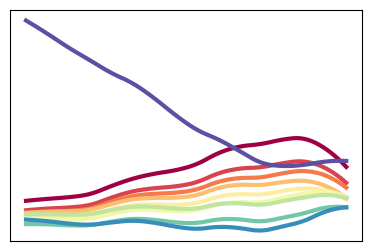

In [174]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import minmax_scale
from scipy.interpolate import interp1d

# extract G1
sG1 = np.array(sgrad[0]) # cortical G1

# 10 bins
gBins = np.arange(0, 110, 10)

# Remove mask and find bin limits
tmpGrpG = minmax_scale(sG1, feature_range=(0,1))
tmpGrpG[~mask_5k] = np.nan
g_split = np.nan_to_num(tmpGrpG)
Ts = np.percentile(g_split, gBins)

# Average profile in each bin, while subtracting the mean profile excluding mask
sprofiles_demean = np.zeros((mean_sprofiles.shape[0], len(gBins)-1))

for ii in range(len(Ts)-1):
    idx = np.where((g_split > Ts[ii]) & (g_split < Ts[ii+1]))[0]
    sprofiles_demean[:, ii] = np.mean(mean_sprofiles[:, idx] - np.mean(mean_sprofiles[:, mask_5k], axis=1)[:, np.newaxis], axis=1)

# Smooth interpolation
smoothed_sprofiles = []
x_values = np.arange(len(sprofiles_demean[:, 0]))

for sprofile in sprofiles_demean.T:
    f = interp1d(x_values, sprofile, kind='quadratic')
    x_interp = np.linspace(0, len(sprofile) - 1, 100)
    y_interp = f(x_interp)
    smoothed_sprofiles.append(y_interp)

# Plot
colors_profiles = plt.cm.Spectral(np.linspace(0, 1, 10))

plt.figure(figsize=(10,3))
plt.subplot(121)

for smoothed_sprofile, color in zip(smoothed_sprofiles, colors_profiles):
    plt.plot(x_interp, smoothed_sprofile, color=color, linewidth=3)

plt.yticks([])
plt.xticks([])
plt.show()


### Original T1map

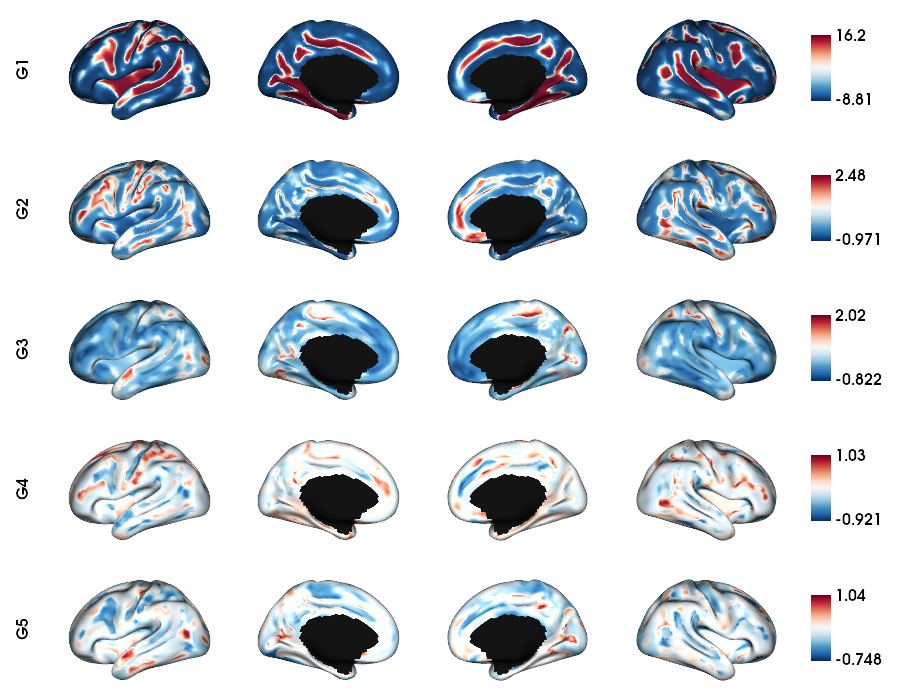

In [51]:
# Calculate the gradients
Ngrad=5
sMPC_all, sgrad = mpc_dm(smpc_all_avg, mask_5k, Ngrad=Ngrad, Smooth=False, kernel="cosine")

# plot the gradients
labels=['G'+str(x) for x in list(range(1,Ngrad+1))]
plot_hemispheres(inf_lh, inf_rh, array_name=sgrad, cmap='RdBu_r', nan_color=(0, 0, 0, 1),
  zoom=1.3, size=(900, 700), embed_nb=True,
  color_bar='right', label_text={'left': labels}, screenshot=False)

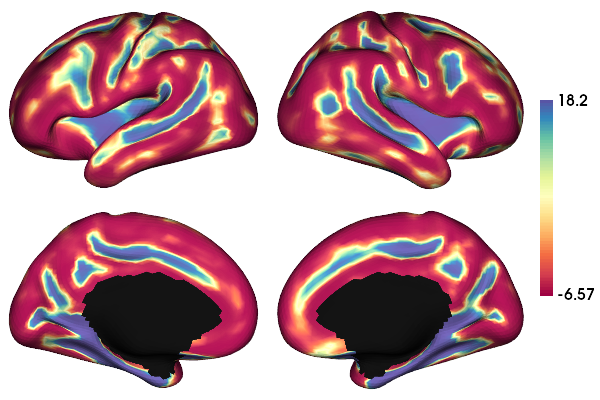

In [172]:
plot_hemispheres(inf_lh, inf_rh, array_name=sgrad[0], cmap='Spectral', nan_color=(0, 0, 0, 1),
  zoom=1.6, size=(600, 400), embed_nb=True, layout_style='grid',
  color_bar='right', screenshot=False)

## Cortex + SWM MPC (T1map)

In [93]:
# Define some variables
Ndim=9684
Nsubjects=10
tMPC=np.empty([Ndim, Ndim, Nsubjects], dtype=float)

# Stack the SWM + GM intensitites then build a total MPC
for i in range(Nsubjects):
    tprofiles[i, :, :] =  np.vstack((sprofiles[i, :, :], np.flip(cprofiles[i, :, :], axis=0)))
    tMPC[:,:,i] = build_mpc(smooth_intensities(tprofiles[i, :, :]), mask_surf)

/tmp/ipykernel_2573928/3896308213.py:22: RuntimeWarning: divide by zero encountered in divide
  MPC = 0.5 * np.log( np.divide(1 + R, 1 - R) )


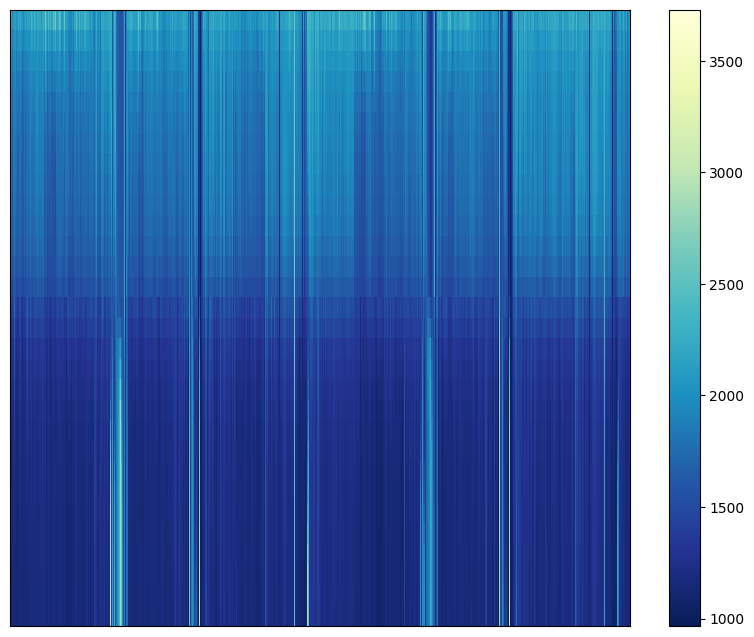

In [81]:
# Stack GM and SWM intensity profiles
mean_tprofiles = np.vstack((mean_sprofiles, np.flip(mean_cprofiles, axis=0)))

# Adjust the figure size as per your requirement
plt.figure(figsize=(10, 8))  # Adjust the values (width, height) as needed

# Plot the pcolormesh
pcm = plt.pcolormesh(mean_tprofiles, cmap='YlGnBu_r', shading='auto')

# Set labels
#plt.xlabel('Vertices')
plt.xticks([])
plt.yticks([])  # Remove y-axis labels

cbar = plt.colorbar(pcm)

plt.show()

In [94]:
# Mean matrix across the z axis (subjects)
tmpc_all_avg = np.mean(tMPC, axis=2)

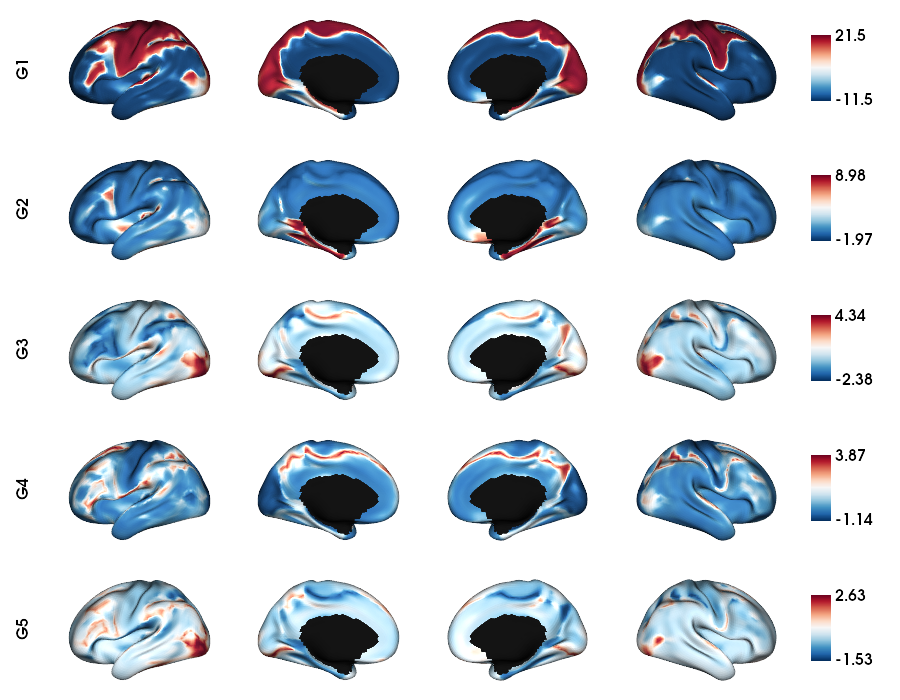

In [95]:
# Calculate the gradients
Ngrad=5
tMPC_all, tgrad = mpc_dm(tmpc_all_avg, mask_5k, Ngrad=Ngrad, Smooth=False, kernel="cosine")

# plot the gradients
labels=['G'+str(x) for x in list(range(1,Ngrad+1))]
plot_hemispheres(inf_lh, inf_rh, array_name=tgrad, cmap='RdBu_r', nan_color=(0, 0, 0, 1),
  zoom=1.3, size=(900, 700), embed_nb=True,
  color_bar='right', label_text={'left': labels}, screenshot=False)

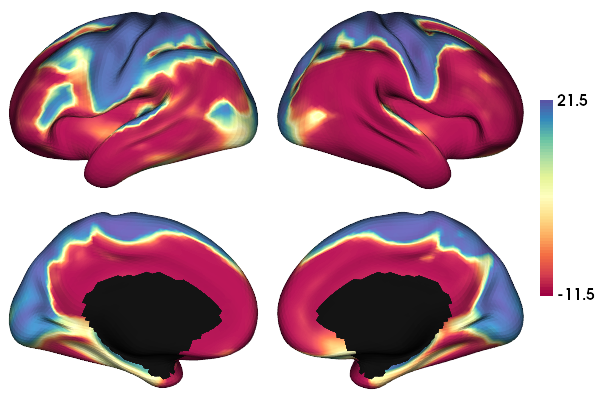

In [175]:
plot_hemispheres(inf_lh, inf_rh, array_name=tgrad[0], cmap='Spectral', nan_color=(0, 0, 0, 1),
  zoom=1.6, size=(600, 400), embed_nb=True, layout_style='grid',
  color_bar='right', screenshot=False)

### Line plot for cortical + SWM T1 map

In [98]:
mean_tprofiles.shape

(30, 9684)

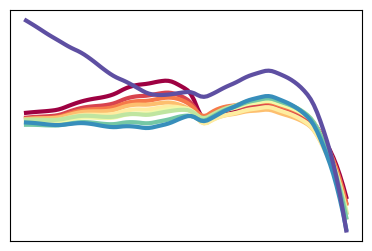

In [177]:
# extract G1
tG1 = np.array(sgrad[0]) # cortical G1

# 10 bins
gBins = np.arange(0, 110, 10)

# Remove mask and find bin limits
tmpGrpG = minmax_scale(tG1, feature_range=(0,1))
tmpGrpG[~mask_5k] = np.nan
g_split = np.nan_to_num(tmpGrpG)
Ts = np.percentile(g_split, gBins)

# Average profile in each bin, while subtracting the mean profile excluding mask
tprofiles_demean = np.zeros((mean_tprofiles.shape[0], len(gBins)-1))

for ii in range(len(Ts)-1):
    idx = np.where((g_split > Ts[ii]) & (g_split < Ts[ii+1]))[0]
    tprofiles_demean[:, ii] = np.mean(mean_tprofiles[:, idx] - np.mean(mean_tprofiles[:, mask_5k], axis=1)[:, np.newaxis], axis=1)

# Smooth interpolation
smoothed_tprofiles = []
x_values = np.arange(len(tprofiles_demean[:, 0]))

for tprofile in tprofiles_demean.T:
    f = interp1d(x_values, tprofile, kind='quadratic')
    x_interp = np.linspace(0, len(tprofile) - 1, 100)
    y_interp = f(x_interp)
    smoothed_tprofiles.append(y_interp)

# Plot
colors_profiles = plt.cm.Spectral(np.linspace(0, 1, 10))

plt.figure(figsize=(10,3))
plt.subplot(121)

for smoothed_tprofile, color in zip(smoothed_tprofiles, colors_profiles):
    plt.plot(x_interp, smoothed_tprofile, color=color, linewidth=3)

plt.yticks([])
plt.xticks([])
plt.show()

In [69]:
mean_tprofiles.shape

(30, 9684)

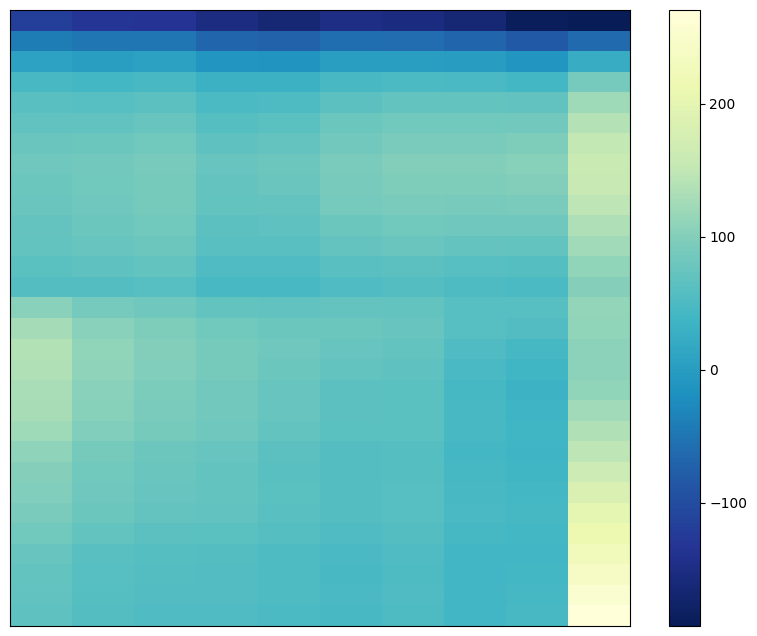

In [97]:
# Adjust the figure size as per your requirement
plt.figure(figsize=(10, 8))  # Adjust the values (width, height) as needed

# Plot the pcolormesh
pcm = plt.pcolormesh(tprofiles_demean, cmap='YlGnBu_r', shading='auto')

# Set labels
#plt.xlabel('Vertices')
plt.xticks([])
plt.yticks([])  # Remove y-axis labels

cbar = plt.colorbar(pcm)

plt.show()

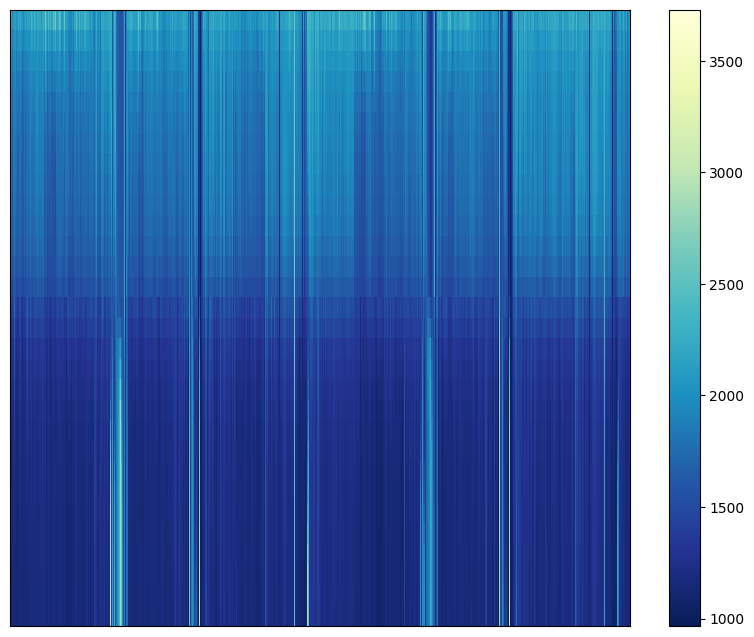

In [80]:
# Adjust the figure size as per your requirement
plt.figure(figsize=(10, 8))  # Adjust the values (width, height) as needed

# Plot the pcolormesh
pcm = plt.pcolormesh(mean_tprofiles, cmap='YlGnBu_r', shading='auto')

# Set labels
#plt.xlabel('Vertices')
plt.xticks([])
plt.yticks([])  # Remove y-axis labels

cbar = plt.colorbar(pcm)

plt.show()

## Cortical Types

In [37]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
def plot_histogram(data, bins=2000, title='Histogram', cmap='afmhot', Range=(0, 2500),
                   xlim=[0,2500], ylim=2000, mode_value=None, val2=None):
    non_zero_values = data[data != 0]
    n, bins, _ = plt.hist(non_zero_values, bins=bins, color='blue', alpha=0.7)
    bin_centers = (bins[:-1] + bins[1:]) / 2  # Compute the bin centers
    
    colormap = cm.get_cmap(cmap)
    colored_bins = colormap(np.interp(bin_centers, [Range[0], Range[1]], [0, 1]))
    plt.bar(bin_centers, n, width=np.diff(bin_centers[0:2]), color=colored_bins)
    
    plt.title(title)
    plt.xlabel('Intensity Value')
    plt.ylabel('Frequency')

    # Remove the outer box line
    for spine in plt.gca().spines.values():
        spine.set_visible(False)
    # Set the grid on the back
    plt.gca().set_axisbelow(True)
    plt.grid(color='gray', linestyle='dashed')

    # Plot a vertical line at the mode value
    if mode_value is not None:
        plt.axvline(x=mode_value[0], color='blue', linestyle='dashed', linewidth=2, label=f'Mode = {mode_value[0]}')
        plt.axvline(x=mode_value[1], color='green', linestyle='dashed', linewidth=2, label=f'Mode = {mode_value[1]}')
    if val2 is not None:
        plt.axvline(x=val2, color='white', linestyle='dashed', linewidth=2, label=f'ModeMRtrix = {val2}')
    
    plt.legend()
    
    # Set x-axis range (adjust as needed)
    plt.xlim(xlim)

    # Set y-axis range (adjust as needed)
    plt.ylim([0, ylim])
    
    plt.show()


In [38]:
# Set the working directory to the 'out' directory
out='/data_/mica3/BIDS_PNI/derivatives' # <<<<<<<<<<<< CHANGE THIS PATH
os.chdir(out)

# This variable will be different for each subject
sub='sub-PNC019'
ses='ses-03'
subjectID=f'{sub}_{ses}'           # <<<<<<<<<<<< CHANGE THIS SUBJECT's ID
subjectDir=f'micapipe_v0.2.0/{sub}/{ses}' # <<<<<<<<<<<< CHANGE THIS SUBJECT's DIRECTORY

# Set paths and variables
dir_FS = 'fastsurfer/' + subjectID
dir_surf = subjectDir + '/surf/'
dir_maps = subjectDir + '/maps/'

In [39]:
# Load annotation file
annot = 'economo'
annot_lh= dir_FS + '/label/lh.' + annot + '_mics.annot'
annot_rh= dir_FS + '/label/rh.' + annot + '_mics.annot'
label = np.concatenate((nb.freesurfer.read_annot(annot_lh)[0], nb.freesurfer.read_annot(annot_rh)[0]), axis=0)

# plot labels on surface
plot_hemispheres(pial_lh, pial_rh, array_name=label, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), cmap='nipy_spectral', transparent_bg=False)

NameError: name 'pial_lh' is not defined

In [40]:
annot = 'economo'
annot_lh= f'{micapipe}/parcellations/{annot}_conte69_lh.label.gii'
annot_rh= f'{micapipe}/parcellations/{annot}_conte69_rh.label.gii'
label = np.concatenate((nb.load(annot_lh).darrays[0].data, nb.load(annot_rh).darrays[0].data), axis=0)

In [10]:
label.shape

(64984,)

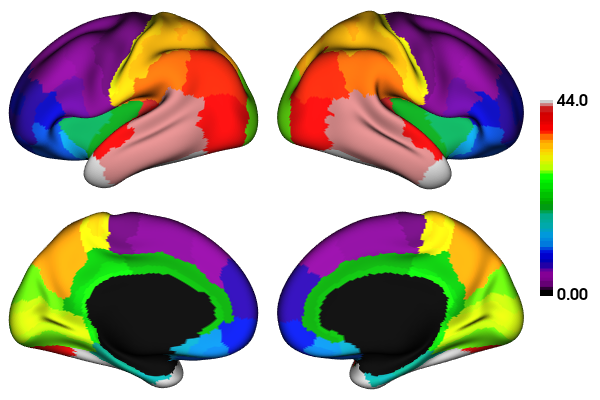

In [41]:
# plot labels on surface
plot_hemispheres(inf_lh32, inf_rh32, array_name=label, size=(600, 400), zoom=1.6, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), cmap='nipy_spectral', transparent_bg=False, color_bar='right', layout_style='grid')

In [14]:
np.unique(label)

array([ 0,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44], dtype=int32)

/tmp/ipykernel_2519870/2530584072.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap(cmap)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


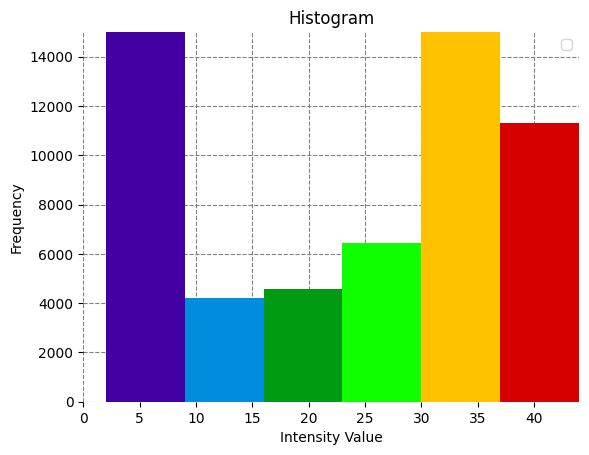

In [19]:
plot_histogram(label, bins=6, title='Histogram', cmap='nipy_spectral', Range=(0, 44),
                   xlim=[0,44], ylim=15000, mode_value=None, val2=None)

## Mesulam classes

In [11]:
from scipy.io import loadmat
import matplotlib.pyplot as plt

# load stuff
from brainspace.datasets import load_mask
mask_32k = load_mask(join=True)


# Load the .mat file
mat_data = loadmat('/data/mica1/03_projects/jessica/micasoft/parcellations/fs_LR-conte69/mesulam_conte69.mat')
mesu = mat_data['mesulam_conte69']

mesu = mesu.astype(float)
mesu[:, ~mask_32k] = np.nan

In [13]:
mesu.shape

(1, 64984)

In [1]:
imgL = nb.gifti.GiftiImage()
imgR = nb.gifti.GiftiImage()

dataL = nb.gifti.GiftiDataArray(mesuL_reshaped)
dataR = nb.gifti.GiftiDataArray(mesuR_reshaped)

imgL.add_gifti_data_array(dataL)
imgR.add_gifti_data_array(dataR)

nb.save(imgL, micapipe_surf + '/fsLR-32k.L_mesulam.shape.gii')
nb.save(imgR, micapipe_surf + '/fsLR-32k.R_mesulam.shape.gii')

NameError: name 'nb' is not defined

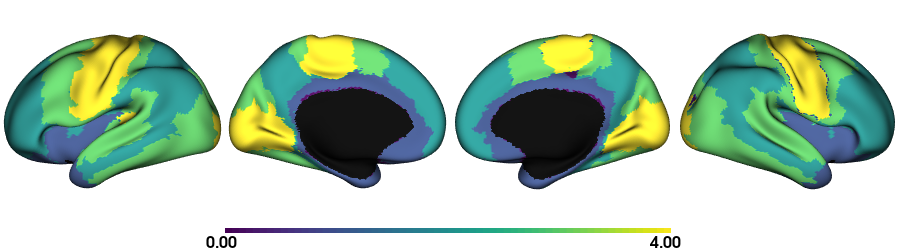

In [12]:
# plot labels on surface
plot_hemispheres(inf_lh32, inf_rh32, array_name=mesu, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), cmap='viridis', transparent_bg=False, color_bar='bottom')

In [112]:
np.unique(mesu, return_counts=True)

(array([ 0.,  1.,  2.,  3.,  4., nan]),
 array([  430,  7245, 20274, 18024, 12585,  6426]))

### Musulam classes (downsample to fsLR5k)

In [32]:
mesuL_5k =  nb.load(micapipe + '/surfaces/fsLR-5k.L_mesulam.shape.gii').darrays[0].data
mesuR_5k =  nb.load(micapipe + '/surfaces/fsLR-5k.R_mesulam.shape.gii').darrays[0].data
mesu_5k = np.concatenate((mesuL_5k, mesuR_5k), axis=0)

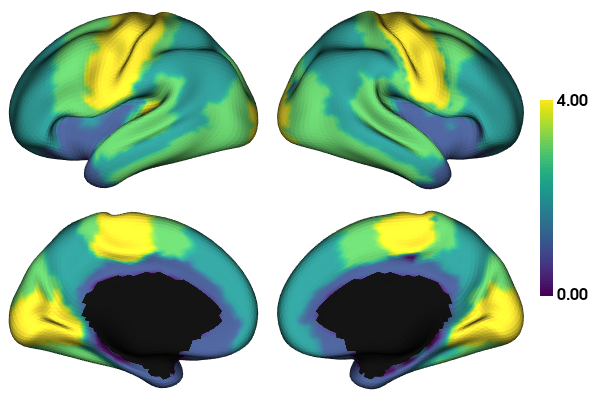

In [29]:
mesu_5k[mask_5k == False] = np.nan

# plot labels on surface
plot_hemispheres(inf_lh, inf_rh, array_name=mesu_5k, size=(600, 400), zoom=1.6, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), cmap='viridis', transparent_bg=False, color_bar='right', layout_style='grid')

In [61]:
mesu_5k = mesu_5k.astype(int)

In [62]:
np.unique(mesu_5k, return_counts=True)

(array([-9223372036854775808,                    0,                    1,
                           2,                    3,                    4]),
 array([ 828,  270, 1176, 3487, 2428, 1495]))

In [76]:
sG1 = sgrad[0]

In [80]:
# Find indices where mesu_5k has values 1, 2, 3, and 4
indices_1 = np.where(mesu_5k == 1)[0]
indices_2 = np.where(mesu_5k == 2)[0]
indices_3 = np.where(mesu_5k == 3)[0]
indices_4 = np.where(mesu_5k == 4)[0]

# Extract values from sgrad corresponding to these indices
values_1 = sG1[indices_1]
values_2 = sG1[indices_2]
values_3 = sG1[indices_3]
values_4 = sG1[indices_4]

/tmp/ipykernel_2835358/3587971960.py:12: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(values_4, label='mesu_5k = 4', shade=True, color=custom_colors[3])


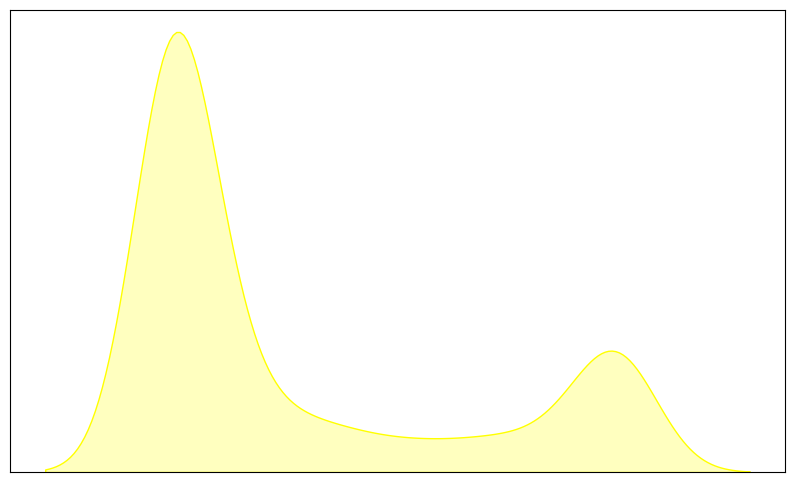

In [98]:
# Define custom colors as RGB tuples (normalized to the range [0, 1])
custom_colors = [(78/255, 86/255, 154/255),  # 1
                 (163/255, 159/255, 100/255),  # 2
                 (47/255, 230/255, 99/255),  # 3
                 (1, 1, 0)]  # 4

# Plot density plots using Seaborn
plt.figure(figsize=(10, 6))
#sns.kdeplot(values_1, label='mesu_5k = 1', shade=True, color=custom_colors[0])
#sns.kdeplot(values_2, label='mesu_5k = 2', shade=True, color=custom_colors[1])
#sns.kdeplot(values_3, label='mesu_5k = 3', shade=True, color=custom_colors[2])
sns.kdeplot(values_4, label='mesu_5k = 4', shade=True, color=custom_colors[3])
plt.xlabel('')
plt.ylabel('')
#plt.title('Density plot of sgrad values for different mesu_5k values')

plt.yticks([])
plt.xticks([])
#plt.legend()
plt.show()

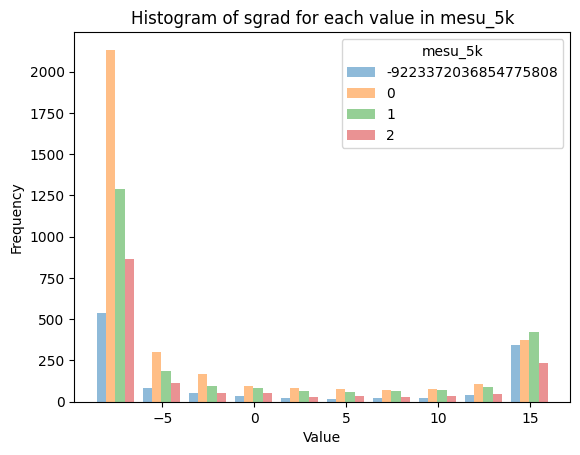

In [89]:
unique_values = np.unique(mesu_5k)
histogram_data = []

for value in [1, 2, 3, 4]:
    indices = np.where(mesu_5k == value)[0]
    histogram_data.append(sG1[indices])

plt.hist(histogram_data, bins=10, alpha=0.5, label=unique_values)
plt.legend(title='mesu_5k')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram of sgrad for each value in mesu_5k')
plt.show() 

In [79]:
sgrad

[array([-7.47166569, -6.38614308, -3.74562843, ..., -7.32046264,
        -7.76098828, -7.02054407]),
 array([0.09737197, 0.31445509, 0.82743266, ..., 0.30490458, 0.0744367 ,
        0.44896869]),
 array([-0.29121162,  0.00096996,  0.49225959, ..., -0.61570475,
        -0.52885639, -0.65656269]),
 array([-0.00844798,  0.11099768,  0.05134817, ...,  0.29564902,
         0.18080965,  0.31972815]),
 array([ 0.2046009 , -0.10549398,  0.23364456, ...,  0.24338451,
         0.215558  ,  0.23867329])]

## Von Economo classes

In [21]:
annot = 'economo'
#annot_lh = '/host/fladgate/local_raid/jessica/microstruct_TLE/data/lh.types.annot'
#annot_rh = '/host/fladgate/local_raid/jessica/microstruct_TLE/data/rh.types.annot'
annot_lh = '/data/mica1/03_projects/youngeun/parc/tpl-fsaverage5_hemi-L_desc-economo.annot'
annot_rh = '/data/mica1/03_projects/youngeun/parc/tpl-fsaverage5_hemi-R_desc-economo.annot'

label_lh = nb.freesurfer.read_annot(annot_lh)[0]
label_rh = nb.freesurfer.read_annot(annot_rh)[0]
label = np.concatenate((label_lh, label_rh), axis = 0)

# Initialize arrays to store the index data for Von Economo classes
parcEcoL = np.zeros(len(label_lh))
parcEcoR = np.zeros(len(label_rh))

# Process left hemisphere data
uLabel_lh = np.unique(label_lh)
for ii in range(len(uLabel_lh)):
    idx = np.where(label_lh == uLabel_lh[ii])[0]
    parcEcoL[idx] = ii + 1

# Process right hemisphere data
uLabel_rh = np.unique(label_rh)
for ii in range(len(uLabel_rh)):
    idx = np.where(label_rh == uLabel_rh[ii])[0]
    parcEcoR[idx] = ii + 1

# Combine the index data for left and right hemispheres
parcEco = np.concatenate((parcEcoL, parcEcoR))

In [18]:
fs5_lh

<BSPolyData object at 0x7fafe744a760 [Wrapping a vtkmodules.vtkCommonDataModel.vtkPolyData(0x1149d140]>

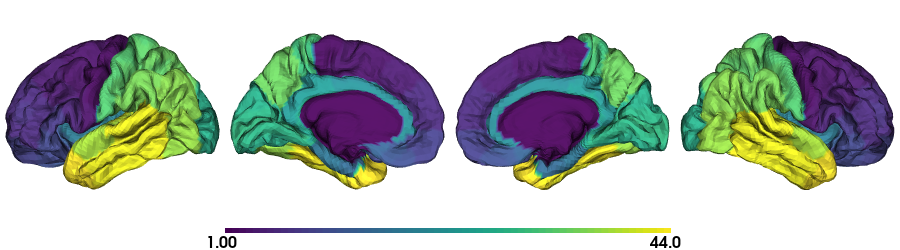

In [22]:
# Load fsaverage5
fs5_lh = read_surface('freesurfer/fsaverage5/surf/lh.pial', itype='fs')
fs5_rh = read_surface('freesurfer/fsaverage5/surf/rh.pial', itype='fs')

# plot labels on surface
plot_hemispheres(fs5_lh, fs5_rh, array_name=parcEco, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), cmap='viridis', transparent_bg=False, color_bar='bottom')

In [49]:
np.unique(parcEco)

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., 26.,
       27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38., 39.,
       40., 41., 42., 43., 44.])

## Blade-like SWM atlas

In [72]:
%%bash 

# ENV variables
MICAPIPE=/data_/mica1/01_programs/micapipe-v0.2.0

# -----------------------------------------------
# Map to volume to the surface
volume=/host/percy/local_raid/youngeun/LONI/LPBA40.AIR.nifti/JHU-ICBM-SWM/lowFA_SWM/JHU-ICBM-FA-1mm-reg2lpba_exclude-DWM-reg2mni_label.nii
surf_dir=/host/percy/local_raid/youngeun/LONI/LPBA40.AIR.nifti/JHU-ICBM-SWM/I_figured_out_SWM/rawdata/micapipe_v0.2.0/sub-MNI152/surf
out=/host/percy/local_raid/youngeun/LONI/LPBA40.AIR.nifti/JHU-ICBM-SWM/lowFA_SWM

# For each hemishphere
for H in L R; do
surf_native=${surf_dir}/sub-MNI152_hemi-${H}_space-nativepro_surf-fsnative_label-white.surf.gii
map_native=${out}/MNI152_hemi-${H}_surf-fsnative_label-white_atlas-blades.shape.gii

    # -----------------------------------------------
    # Map from volume to the highest resolution surface (fsnative: more vertices)
    wb_command -volume-to-surface-mapping \
    ${volume} \
    ${surf_native} \
    ${map_native} \
    -enclosing

    # -----------------------------------------------
    # Resample the atlas to fsLR-5k and fsLR-32k
    # MUST be without interpolation
    for surf in fsLR-5k fsLR-32k; do
        wb_command -metric-resample \
        ${map_native} \
        ${surf_dir}/sub-MNI152_hemi-${H}_surf-fsnative_label-sphere.surf.gii \
        "${MICAPIPE}/surfaces/${surf}.${H}.sphere.reg.surf.gii" \
        ADAP_BARY_AREA \
        "${out}/MNI152_hemi-${H}_surf-${surf}_label-white_atlas-blades.shape.gii" \
        -area-surfs \
        ${surf_native} \
        ${surf_dir}/sub-MNI152_hemi-${H}_space-nativepro_surf-${surf}_label-white.surf.gii \
        -largest
    done

done


In [23]:
%%bash
pwd

/data_/mica3/BIDS_PNI/derivatives/micapipe_v0.2.0


In [150]:
# Environment variables
surf='fsLR-32k'
out_maps='/host/percy/local_raid/youngeun/LONI/LPBA40.AIR.nifti/JHU-ICBM-SWM/noFA_SWM'
out_surf='/host/percy/local_raid/youngeun/LONI/LPBA40.AIR.nifti/JHU-ICBM-SWM/I_figured_out_SWM/rawdata/micapipe_v0.2.0/sub-MNI152/surf'

# Load MNI white matter surface
MNI_wmL = read_surface(f'{out_surf}/sub-MNI152_hemi-L_space-nativepro_surf-{surf}_label-white.surf.gii', itype='gii')
MNI_wmR = read_surface(f'{out_surf}/sub-MNI152_hemi-R_space-nativepro_surf-{surf}_label-white.surf.gii', itype='gii')

# Load blade metric
bladesL =  nb.load(f'{out_maps}/MNI152_hemi-L_surf-{surf}_label-white_atlas-blades.shape.gii').darrays[0].data
bladesR =  nb.load(f'{out_maps}/MNI152_hemi-L_surf-{surf}_label-white_atlas-blades.shape.gii').darrays[0].data
blades = np.concatenate((bladesL, bladesR), axis=0)


In [39]:
np.unique(blades)

array([  0.,  21.,  23.,  25.,  27.,  29.,  31.,  33.,  41.,  43.,  45.,
        47.,  49.,  61.,  63.,  65.,  67.,  81.,  83.,  85.,  87.,  89.,
        91., 101., 121., 122., 161., 163., 165., 182.], dtype=float32)

In [154]:
# Remove the medial wall
blades[blades==0]=np.NaN

# NaNing everything >= than 180
blades[blades>=160]=np.NaN

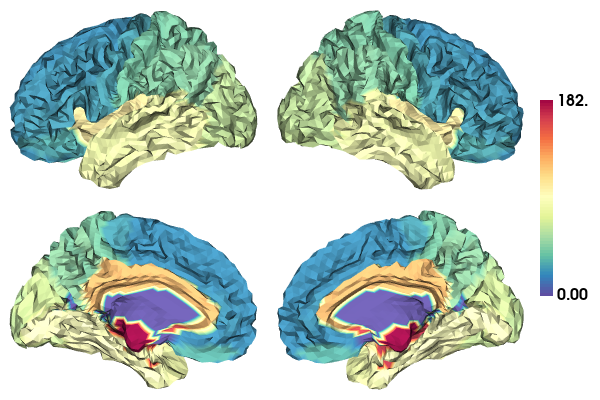

In [27]:
# plot labels on surface
plot_hemispheres(MNI_wmL, MNI_wmR, array_name=blades, size=(600, 400), zoom=1.6, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), cmap='Spectral_r', transparent_bg=False, color_bar='right', layout_style='grid')

### Resample the labels

In [152]:
for i in range(len(blades)):

    if blades[i] == 21:
        blades[i] = 1
    elif blades[i] == 23:
        blades[i] = 2
    elif blades[i] == 25 or blades[i] == 29 or blades[i] == 31 or blades[i] == 33:
        blades[i] = 3
    elif blades[i] == 27:
        blades[i] = 4
    elif blades[i] == 41:
        blades[i] = 5
    elif blades[i] == 43 or blades[i] == 49:
        blades[i] = 6
    elif blades[i] == 45 or blades[i] == 47 or blades[i] == 81:
        blades[i] = 7
    elif blades[i] == 61 or blades[i] == 63 or blades[i] == 65 or blades[i] == 67 or blades[i] == 89:
        blades[i] = 8
    elif blades[i] == 83 or blades[i] == 85 or blades[i] == 91 or blades[i] == 87:
        blades[i] = 9
    elif blades[i] == 101:
        blades[i] = 10
    elif blades [i] >= 103:
        blades[i] = 0

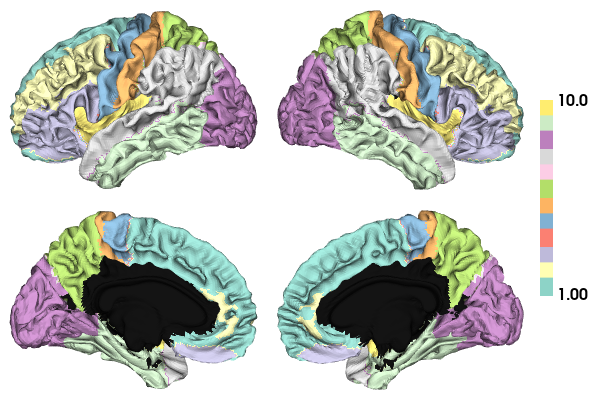

In [183]:
import cmocean
from cmap import Colormap

# plot labels on surface
plot_hemispheres(MNI_wmL, MNI_wmR, array_name=blades, size=(600, 400), zoom=1.6, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), cmap='Set3', transparent_bg=False, color_bar='right', layout_style='grid')